# ECS7020P mini-project submission (Advanced)


I formulated my own machine learning problem and built a machine learning solution using the MLEnd London Sounds dataset. 


# 1 Author

**Student Name**: Milen Rosum  
**Student ID**: 210974212



# 2 Problem formulation

The machine problem consists of using noise features to determine whether the location of a recording is in Euston or not. This is interesting as this is solved only using the features such as pitch, power and other features extracted from the audion files and seeing how these differ.

# 3 Machine Learning pipeline

The data with all the audios required is extracted for our analysis. We then use a function containing the librosa features to apply to our dataset. Following this, the data is split into a training and test/validation so we can train our model to allow us to see which features are the most important. Once this model is trained, it can then be used on the test set also where we can find the validation accuracy.

# 4 Transformation stage


The transformation used in the analysis is feature extractions. For the feature extraction, initially a large number of features such as chroma_stft an mfcc from the librosa library are selected. The data input is a file which contains all the audio recordings. The output is then checked for importance whereby features of small importance are dropped. The important features then become the new features. The accuracy between the new and previous features can then be compared for their accuracy.

# 5 Modelling



The models that I will be building are the Support Vector Classification model and Random Forest Classifier. SVC is useful as we do not know much about the data and the features in regards to which we would expect to be the best and so it is able to categorise the data effeciently. Random forests are also really good to use as they can perform both regression as well as classification tasks, furthermore, it it able to handle large datasets effectively.

# 6 Methodology


The data will be trained on 20% of the audios in order to see the effects and understand the model. Once this model has been processed, you test the model by making predicitions against the test set.

In order to validate the model, the precision and accuracy can be looked into. Codes can be run to output the accuracy and for precision a confusion matrix can be produced.

# 7 Dataset

In [1]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa
import librosa.display

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.datasets import make_classification

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def download_url(url, save_path):
    with urllib.request.urlopen(url) as dl_file:
        with open(save_path, 'wb') as out_file:
            out_file.write(dl_file.read())

In [ ]:
url  = "https://collect.qmul.ac.uk/down?t=610I73D2G2RLS4BI/R8RDLM2R3O9FHEMR92GKGR0"
save_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_Sample.zip'
download_url(url, save_path)

In [2]:
path = '/content/drive/MyDrive/Data/MLEndLS'
os.listdir(path)

['sample',
 'MLEnd_2022_Starter_kit.ipynb',
 'MLEndLS_1.zip',
 'MLEndLS_2.zip',
 'MLEndLS_3.zip',
 'MLEndLS_5.zip',
 'MLEndLS_4.zip',
 'Data',
 '.ipynb_checkpoints',
 'data.csv',
 'df_euston_imp.csv',
 'df_imp.csv',
 'df_euston.csv',
 'df.csv',
 'MLEndLS_Sample.zip']

In [ ]:
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/sample/'
zip_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_1.zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)


In [ ]:
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/sample/'
zip_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_2.zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)

In [ ]:
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/sample/'
zip_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_3.zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)

In [ ]:
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/sample/'
zip_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_4.zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)

In [ ]:
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/sample/'
zip_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_5.zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)

In [3]:
path = '/content/drive/MyDrive/Data/MLEndLS/sample/*.wav'
files = glob.glob(path)
len(files)

2498

In [ ]:
for _ in range(5):
  n = np.random.randint(50)
  display(ipd.Audio(files[n]))

In [4]:
MLENDLS_df = pd.read_csv('./MLEndLS.csv').set_index('file_id') 
MLENDLS_df

,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176
...,...,...,...,...
2496.wav,westend,trafalgar,outdoor,S151
2497.wav,campus,square,outdoor,S6
2498.wav,westend,national,indoor,S96


In [ ]:
for file in files:
   print(file.split('/')[-1])

1896.wav
1897.wav
1898.wav
1899.wav
1900.wav
1901.wav
1902.wav
1903.wav
1904.wav
1905.wav
1906.wav
1907.wav
1908.wav
1909.wav
1911.wav
1910.wav
1912.wav
1913.wav
1915.wav
1914.wav
1916.wav
1917.wav
1918.wav
1920.wav
1921.wav
1919.wav
1922.wav
1923.wav
1924.wav
1925.wav
1926.wav
1927.wav
1928.wav
1930.wav
1929.wav
1931.wav
1932.wav
1933.wav
1935.wav
1934.wav
1936.wav
1937.wav
1938.wav
1940.wav
1939.wav
1941.wav
1942.wav
1943.wav
1944.wav
1946.wav
1945.wav
1947.wav
1949.wav
1948.wav
1951.wav
1950.wav
1952.wav
1953.wav
1954.wav
1955.wav
1956.wav
1957.wav
1958.wav
1959.wav
1962.wav
1960.wav
1961.wav
1963.wav
1964.wav
1965.wav
1966.wav
1967.wav
1968.wav
1969.wav
1972.wav
1971.wav
1973.wav
1970.wav
1974.wav
1976.wav
1975.wav
1977.wav
1978.wav
1979.wav
1980.wav
1982.wav
1981.wav
1984.wav
1983.wav
1986.wav
1985.wav
1987.wav
1988.wav
1990.wav
1989.wav
1991.wav
1992.wav
1993.wav
1996.wav
1995.wav
1997.wav
1998.wav
1999.wav
2000.wav
2002.wav
1994.wav
2001.wav
2003.wav
2005.wav
2004.wav
2006.wav
2

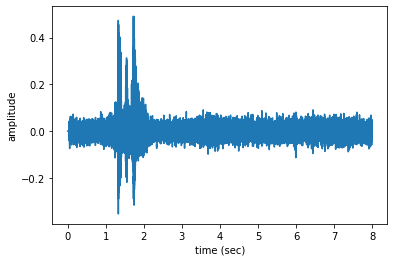

In [ ]:
n=0
fs = None # Sampling frequency
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

In [ ]:
MLENDLS_df.loc[files[n].split('/')[-1]]

In [ ]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

# 8 Results

In [5]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

In [6]:
def getXy(files, labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]
    yi = labels_file.loc[fileID]['in_out']=='indoor'

    fs = None 
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)
      
    power = np.sum(x**2)/len(x)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)
    chroma_stft = librosa.feature.chroma_stft(x, sr = fs)
    chroma_cens = librosa.feature.chroma_cens(x, fs)
    melspectrogram = librosa.feature.melspectrogram(x, fs)
    mfcc = librosa.feature.mfcc(x, fs)
    rms = librosa.feature.rms(x)
    spectral_bandwidth = librosa.feature.spectral_bandwidth(x, fs)
    spectral_contrast = librosa.feature.spectral_contrast(x, fs)
    spectral_rolloff = librosa.feature.spectral_rolloff(x, fs)
    poly_features = librosa.feature.poly_features(x,fs)
    tonnetz = librosa.feature.tonnetz(x, fs)
    zero_crossing_rate = librosa.feature.zero_crossing_rate(x, fs)
    tempogram = librosa.feature.tempogram(x, fs)

    xi = [power,pitch_mean,pitch_std,voiced_fr, chroma_stft.mean(), chroma_cens.mean(), melspectrogram.mean(), mfcc.mean(), rms.mean(), spectral_bandwidth.mean(), spectral_contrast.mean(), spectral_rolloff.mean(), poly_features.mean(), tonnetz.mean(), zero_crossing_rate.mean(), tempogram.mean()]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

Once I ran the X, y function call, the output was saved into a csv file called df.

In [12]:
df_euston = pd.read_csv('df_euston.csv', index_col = (['Unnamed: 0']))
df_euston

X = df_euston.iloc[:,:16]
y = df_euston['InEuston']

In [21]:
df_euston

,power,pitch_mean,pitch_std,voiced_fr,chroma_stft.mean,chroma_cens.mean,melspectrogram.mean,mfcc.mean,rms.mean,spectral_bandwidth.mean,spectral_contrast.mean,spectral_rolloff.mean,poly_features.mean,tonnetz.mean,zero_crossing_rate.mean,tempogram.mean,InEuston
0,0.004369,116.899488,10.287229,0.078261,0.626309,0.274558,0.827452,-2.582458,0.054045,1759.447068,16.044755,2099.643342,0.660767,-0.004866,0.032634,0.277105,False
1,0.014267,243.376561,5.707610,0.044313,0.645662,0.281102,2.811228,0.888243,0.104672,2152.645140,17.074012,1875.646955,0.915908,-0.002599,0.017348,0.266659,False
2,0.013198,318.156936,0.000000,0.001441,0.691268,0.271274,2.510845,1.683097,0.098020,2738.441892,16.001180,3714.849871,0.899486,-0.000096,0.032422,0.286039,False
3,0.009286,185.944346,55.522424,0.089181,0.486668,0.280255,1.775697,-1.067773,0.085638,2407.061989,18.664994,3372.874049,0.926180,-0.000979,0.035505,0.282542,False
4,0.004520,287.486047,47.103938,0.078404,0.620865,0.277605,0.754833,-1.352589,0.054420,2037.490006,18.303390,2975.017866,0.626155,0.015205,0.029481,0.270289,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2493,0.003551,146.037282,15.461934,0.049333,0.628541,0.272571,0.681831,-1.660172,0.045342,2808.937996,16.069463,4047.983789,0.524936,0.009893,0.031142,0.281571,True
2494,0.015264,143.877308,9.612964,0.049858,0.585127,0.280407,2.828821,1.370840,0.114786,2769.609433,19.074386,3295.868389,1.514011,-0.000950,0.038303,0.272447,False
2495,0.010931,186.377352,25.218906,0.101072,0.481765,0.273840,2.033713,-0.745802,0.085027,3540.488569,16.727421,6136.270399,1.096113,-0.012794,0.061873,0.272989,False
2496,0.009038,253.163471,31.749052,0.082749,0.588337,0.267495,1.606088,0.453342,0.085146,2877.810776,21.311649,6488.470536,1.063363,0.033146,0.070023,0.260357,False


Test, train split

In [33]:
X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.8)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((499, 16), (1999, 16), (499,), (1999,))

In [34]:
# fit the model
model  = svm.SVC(C=1)
model.fit(X_train,y_train)

# predict the test set results
yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.8937875751503006
Validation  Accuracy 0.9094547273636818
The support vectors are (201, 16)


In [35]:
# fit the model
clf = RandomForestClassifier(random_state=0)
clf.fit(X_train, y_train)

# predict the test set results
yt_pred = clf.predict(X_train)
yv_pred = clf.predict(X_val)

print('Training Accuracy', np.mean(yt_pred==y_train))
print('Validation  Accuracy', np.mean(yv_pred==y_val))

Training Accuracy 1.0
Validation  Accuracy 0.9054527263631816


In [36]:
importances = clf.feature_importances_
importances

array([0.04115904, 0.07815391, 0.04620364, 0.04495891, 0.09606634,
       0.06365433, 0.04857179, 0.04304698, 0.05464821, 0.05516543,
       0.09685557, 0.05035645, 0.06104935, 0.10212974, 0.06267139,
       0.05530891])

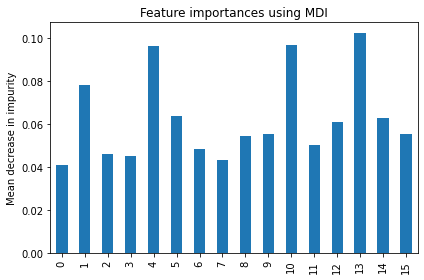

In [37]:
clf_importances = pd.Series(importances)

fig, ax = plt.subplots()
clf_importances.plot.bar(ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

This told me that the most important features were chroma_stft and mfcc as they had the highest importance level in the graph displayed. 

The function was then run again with only these new important features 

In [ ]:
def getXy(files, labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]
    yi = labels_file.loc[fileID]['in_out']=='indoor'

    fs = None 
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))

    chroma_stft = librosa.feature.chroma_stft(x, fs)
    spectral_contrast = librosa.feature.spectral_contrast(x, fs)
    tonnetz = librosa.feature.tonnetz(x, fs)

    xi = [chroma_stft.mean(), spectral_contrast.mean(), tonnetz.mean()]
   
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

In [39]:
df_euston_imp = pd.read_csv('df_euston_imp.csv', index_col = (['Unnamed: 0']))
df_euston_imp

Xf = df_euston_imp.iloc[:,:2]
yf = df_euston_imp['InEuston']

In [40]:
df_euston_imp = pd.DataFrame(data = (Xf), columns = ['chroma_stft.mean', 'spectral_contrast.mean', 'tonnetz.mean'])
df_euston_imp['InEuston'] = yf
df_euston_imp

,chroma_stft.mean,spectral_contrast.mean,tonnetz.mean,InEuston
0,0.626309,16.044755,NaN,False
1,0.645662,17.074012,NaN,False
2,0.691268,16.001180,NaN,False
3,0.486668,18.664994,NaN,False
4,0.620865,18.303390,NaN,False
...,...,...,...,...
2493,0.628541,16.069463,NaN,False
2494,0.585127,19.074386,NaN,False
2495,0.481765,16.727421,NaN,False
2496,0.588337,21.311649,NaN,False


In [41]:
Xf_train, Xf_val, yf_train, yf_val = train_test_split(Xf,yf,test_size=0.8)
Xf_train.shape, Xf_val.shape, yf_train.shape, yf_val.shape

((1998, 2), (500, 2), (1998,), (500,))

In [45]:
# fit the model
model2  = svm.SVC(C=1)
model2.fit(Xf_train,yf_train)

# predict the test set results
yft_p = model2.predict(Xf_train)
yfv_p = model2.predict(Xf_val)

print('Training Accuracy', np.mean(yft_p==yf_train))
print('Validation  Accuracy', np.mean(yfv_p==yf_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.534034034034034
Validation  Accuracy 0.5
The support vectors are (1863, 2)


In [46]:
# fit the model
clf2 = RandomForestClassifier(random_state=0)
clf2.fit(Xf_train, yf_train)

# predict the test set results
yft_pred = clf2.predict(Xf_train)
yfv_pred = clf2.predict(Xf_val)

print('Training Accuracy', np.mean(yft_pred==yf_train))
print('Validation  Accuracy', np.mean(yfv_pred==yf_val))

Training Accuracy 1.0
Validation  Accuracy 0.656


In [44]:
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)
print('The labels vector is', y)

The shape of X is (2498, 16)
The shape of y is (2498,)
The labels vector is 0       False
1       False
2       False
3       False
4        True
        ...  
2493     True
2494    False
2495    False
2496    False
2497    False
Name: InEuston, Length: 2498, dtype: bool


In [47]:
print(' The number of indoor recordings is ', np.count_nonzero(yf))
print(' The number of outdoor recordings is ', yf.size - np.count_nonzero(yf))

 The number of indoor recordings is  1181
 The number of outdoor recordings is  1317


# 9 Conclusions

As displayed above, I used a technique to remove the non important features. Using this, I expected my accuracy to increase giving me a better indication of which areas are in Euston and which are not. However, from my results I can see that instead the accuracy has decreased for example in the test set for SVM it has gone from 0.909 to 0.5 and similarly for random forests it has also decreased but from 0.905 to 0.656. This shows that the model is not the best and not very accurate. 

In order to improve the findings, a larger dataset could have been used to improve the model. There was also a time limitation however if there was more time, I would have carried out a KNN and/or K mean fit to see whether this could have possibly been better suited and would have had a better more improved accuracy. Also in order to see the precision I could have used a confusion matrix.